In [1]:
import numpy as np
from nltk import edit_distance
import pandas as pd
from sklearn.cluster import HDBSCAN
from transformers import BertForMaskedLM, BertTokenizer, pipeline, T5Tokenizer, T5EncoderModel
import re
import torch
import matplotlib.pyplot as plt
import umap
import json
import matplotlib.patches as mpatches
import plotly.express as px

1. take dataset 
2. take current row 
3. split it into: 
    - CDR3, V, J 
    - Epitope, MHC A, MHC B, MHC class 
4. take next (random) row (or for each)
5. split it into: 
    - CDR3, V, J 
    - Epitope, MHC A, MHC B, MHC class
6. compute levenshtein distance for: 
    - CDR3 region (row A to row B)
    - Epitopes (row A to row B)
7. if they are NOT to similar => search new row B 

In [2]:
read_path_beta = "../data/customDatasets/backup/beta_concatenated.tsv"
beta_df = pd.read_csv(read_path_beta, sep="\t")

/tmp/ipykernel_62280/1569563474.py:2: DtypeWarning: Columns (1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  beta_df = pd.read_csv(read_path_beta, sep="\t")


In [3]:
beta_df

,TCR_name,TRAV,TRAJ,TRA_CDR3,TRBV,TRBJ,TRB_CDR3,TRAC,TRBC,TRA_leader,...,TRA_5_prime_seq,TRA_3_prime_seq,TRB_5_prime_seq,TRB_3_prime_seq,Epitope,Score,MHC A,MHC B,MHC class,Binding
0,1,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSYLPGQGDHYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1
1,2,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSFEAGQGFFSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1
2,3,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSFEPGQGFYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1
3,4,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSYEPGQVSHYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1
4,5,NaN,NaN,NaN,TRBV14*01,TRBJ2-1*01,CASSALASLNEQFF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52887,52888,TRAV25,TRAJ28,CAGSGAGSYQLTF,NaN,NaN,CASSLEGQASSYEQYF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,CLGGLLTMV,NaN,NaN,NaN,NaN,1
52888,52889,TRAV25,TRAJ28,CAGLGAGSYQLTF,NaN,NaN,CASSLEGQGASYEQYF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,CLGGLLTMV,NaN,NaN,NaN,NaN,1
52889,52890,TRAV17*01,TRAJ11*01,CATEGNSGYSTLTF,NaN,NaN,CASSSQGGNYGYTF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLYALALLL,NaN,NaN,NaN,NaN,1
52890,52891,TRAV17*01,TRAJ11*01,CATEGDSGYSTLTF,NaN,NaN,CASSYQGGNYGYTF,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,FLYALALLL,NaN,NaN,NaN,NaN,1


In [4]:
max_index = len(beta_df) - 1 
negative_epitopes = []
leven_threshold = 4 # this number is a magic number... => maybe change to random in reasonable intervall?
# if we use a too high one only a few epitopes (the longer ones) can be potentially choosed. 
# This because only for the longer epitopes the levenshtein distance can then be matched

In [5]:
def search_negative_epitope(df, index):
    df = df
    index = index
    epitope = df["Epitope"][index]
    # print(epitope)
    random_epitope_index = np.random.randint(0, max_index)
    random_epitope = df["Epitope"][random_epitope_index]
    leven_dist = edit_distance(epitope, random_epitope)

    if(leven_dist >= leven_threshold): 
        negative_epitopes.append(random_epitope)
    else: 
        search_negative_epitope(df, index)

In [6]:
# This takes some minutes, thats why it is commented out! If needed, remove the comments!
'''
for i, epitope in enumerate(beta_df["Epitope"]): 
    search_negative_epitope(beta_df, i)
'''

'\nfor i, epitope in enumerate(beta_df["Epitope"]): \n    search_negative_epitope(beta_df, i)\n'

In [7]:
negative_epitopes_df = pd.DataFrame(negative_epitopes, columns=["Negative Epitope"])
negative_epitopes_df

,Negative Epitope


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

I (CG) think that this is a bit hacky, this beacuase we compare sequences with different length and the Levenshtein distance is designed to compare strings from the same length...

Idea: create embedding of epitope and measure similarity of them or cluster them...

The output dimensions from [ProtBert on HuggingFace](https://huggingface.co/Rostlab/prot_bert) seems wrong in my opinion... => not wrong but somehow not usable directly as a representation. After elaborating i saw that in the [GitHub Repo of the ProtTrans](https://github.com/agemagician/ProtTrans/tree/master?tab=readme-ov-file#models) they promote another, better performing model called ProtT5.

In [8]:
import torch
torch.cuda.is_available()

False

In [9]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("Using device: {}".format(device))

Using device: cpu


In [10]:
#@title Load encoder-part of ProtT5 in half-precision. { display-mode: "form" }
# Load ProtT5 in half-precision (more specifically: the encoder-part of ProtT5-XL-U50 in half-precision)
transformer_link = "Rostlab/prot_t5_xl_half_uniref50-enc"
print("Loading: {}".format(transformer_link))
model = T5EncoderModel.from_pretrained(transformer_link)
if device==torch.device("cpu"):
  print("Casting model to full precision for running on CPU ...")
  model.to(torch.float32) # only cast to full-precision if no GPU is available
model = model.to(device)
model = model.eval()
tokenizer = T5Tokenizer.from_pretrained(transformer_link, do_lower_case=False, legacy=True )

Loading: Rostlab/prot_t5_xl_half_uniref50-enc
Casting model to full precision for running on CPU ...


### CONSIDER THIS:
Maybe instead of just passing the Epitope we should also pass the MHC information available.. This because in my opinion if I pass the same epitope I should theoretically always get the same embedding, right? => After consideration: This is in my opinion not feasible as the PLMs only want AA sequences as input (?)

In [45]:
epitopes = set(beta_df["Epitope"].to_list())
len(epitopes)

1331

In [12]:
# this will replace all rare/ambiguous amino acids by X and introduce white-space between all amino acids
processed_epitopes = [(sequence, " ".join(list(re.sub(r"[UZOB]", "X", sequence)))) for sequence in epitopes]
# processed_epitopes

In [13]:
def process_batch(processed_seqs):
    # Extract just the processed sequences for tokenization
    sequences = [seq[1] for seq in processed_seqs]
    ids = tokenizer.batch_encode_plus(sequences, add_special_tokens=True, padding="longest", return_tensors="pt")
    input_ids = ids['input_ids'].to(device)
    attention_mask = ids['attention_mask'].to(device)
    
    with torch.no_grad():
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
    
    last_hidden_states = outputs.last_hidden_state
    
    # Now, return embeddings mapped to the original sequence
    embeddings = {}
    for i, (original_seq, _) in enumerate(processed_seqs):
        seq_len = attention_mask[i].sum().item() - 2  # Subtract [CLS] and [SEP]
        valid_embeddings = last_hidden_states[i, 1:seq_len+1]
        mean_embedding = valid_embeddings.mean(dim=0)
        embeddings[original_seq] = mean_embedding.cpu().numpy()  # Use original sequence as key
    
    return embeddings

In [14]:

batch_size = 256
sequence_to_embedding = {}

# Batch processing with a dictionary, using original sequences as keys
for i in range(0, len(processed_epitopes), batch_size):
    batch_sequences = processed_epitopes[i:i+batch_size]
    batch_embeddings = process_batch(batch_sequences)
    sequence_to_embedding.update(batch_embeddings)


In [15]:

beta_df["Epitope Embedding"] = beta_df["Epitope"].map(sequence_to_embedding)
beta_df


,TCR_name,TRAV,TRAJ,TRA_CDR3,TRBV,TRBJ,TRB_CDR3,TRAC,TRBC,TRA_leader,...,TRA_3_prime_seq,TRB_5_prime_seq,TRB_3_prime_seq,Epitope,Score,MHC A,MHC B,MHC class,Binding,Epitope Embedding
0,1,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSYLPGQGDHYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1,"[0.08082553, 0.018622607, -0.0628108, -0.11538..."
1,2,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSFEAGQGFFSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1,"[0.08082553, 0.018622607, -0.0628108, -0.11538..."
2,3,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSFEPGQGFYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1,"[0.08082553, 0.018622607, -0.0628108, -0.11538..."
3,4,NaN,NaN,NaN,TRBV13*01,TRBJ1-5*01,CASSYEPGQVSHYSNQPQHF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1,"[0.08082553, 0.018622607, -0.0628108, -0.11538..."
4,5,NaN,NaN,NaN,TRBV14*01,TRBJ2-1*01,CASSALASLNEQFF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLKEKGGL,2.0,HLA-B*08,B2M,MHCI,1,"[0.08082553, 0.018622607, -0.0628108, -0.11538..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52887,52888,TRAV25,TRAJ28,CAGSGAGSYQLTF,NaN,NaN,CASSLEGQASSYEQYF,NaN,NaN,NaN,...,NaN,NaN,NaN,CLGGLLTMV,NaN,NaN,NaN,NaN,1,"[0.1711801, 0.015042258, -0.16186886, -0.13140..."
52888,52889,TRAV25,TRAJ28,CAGLGAGSYQLTF,NaN,NaN,CASSLEGQGASYEQYF,NaN,NaN,NaN,...,NaN,NaN,NaN,CLGGLLTMV,NaN,NaN,NaN,NaN,1,"[0.1711801, 0.015042258, -0.16186886, -0.13140..."
52889,52890,TRAV17*01,TRAJ11*01,CATEGNSGYSTLTF,NaN,NaN,CASSSQGGNYGYTF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLYALALLL,NaN,NaN,NaN,NaN,1,"[0.1508742, 0.04842263, -0.122389585, -0.13895..."
52890,52891,TRAV17*01,TRAJ11*01,CATEGDSGYSTLTF,NaN,NaN,CASSYQGGNYGYTF,NaN,NaN,NaN,...,NaN,NaN,NaN,FLYALALLL,NaN,NaN,NaN,NaN,1,"[0.1508742, 0.04842263, -0.122389585, -0.13895..."


In [16]:

# This is needed becuase the embedding is huge and otherwise it would be stored with line breaks (\n) 
# This would make it difficult while reading the file
beta_df['Epitope Embedding'] = beta_df['Epitope Embedding'].apply(lambda x: json.dumps(x.tolist()))



In [23]:
to_path = "../data/customDatasets/negative_samples/temp"
file_name = "beta_concatenated_with_epitope_embedding.tsv"

In [24]:
# beta_df.to_csv(to_path+"/"+file_name, sep="\t", index=False)

In [25]:
beta_df = pd.read_csv(to_path+"/"+file_name, sep="\t")
beta_df['Epitope Embedding'] = beta_df['Epitope Embedding'].apply(lambda x: np.array(json.loads(x)))

/tmp/ipykernel_62280/679740710.py:1: DtypeWarning: Columns (1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  beta_df = pd.read_csv(to_path+"/"+file_name, sep="\t")


In [26]:
embeddings = []
for i, embedding in enumerate(beta_df["Epitope Embedding"]): 
    # print(str(embedding.tolist()))
    embeddings.append(str(embedding.tolist()))

len(set(embeddings))

1331

In [27]:
len(set(beta_df["Epitope"]))

1331

## Embedding Similarity Approach

In [28]:
def cosine_similarity(embedding1, embedding2): 
    cosine = np.dot(embedding1,embedding2)/(np.linalg.norm(embedding1)*np.linalg.norm(embedding2))
    return cosine

In [29]:
max_index = len(beta_df) - 1 
negative_samples_cosine = []

In [30]:
def is_valid_negative(cosine_similarity, current_epitope, random_epitope): 
    is_valid = False
    cosine_threshold = np.random.uniform(-0.5, 0.5)

    if (cosine_similarity <= cosine_threshold) \
        and (current_epitope != random_epitope): 
        is_valid = True 

    return is_valid


In [31]:
def search_negative_epitope_embedding(df, index, current_epitope):
    df = df
    index = index
    epitope = current_epitope
    embedding = df["Epitope Embedding"][index]
    # print(epitope_embedding)
    random_epitope_index = np.random.randint(0, max_index)
    random_epitope = df["Epitope"][random_epitope_index]
    random_epitope_embedding = df["Epitope Embedding"][random_epitope_index]
    cosine = cosine_similarity(embedding, random_epitope_embedding)

    if is_valid_negative(cosine, epitope, random_epitope): 
        negative_samples_cosine.append(random_epitope)
    else: 
        search_negative_epitope(df, index)        

In [32]:
# This takes some minutes, thats why it is commented out! If needed, remove the comments!

for i, epitope in enumerate(beta_df["Epitope"]): 
    search_negative_epitope_embedding(beta_df, i, epitope)


In [33]:
negative_samples_cosine

['FRDYVDRFYKTLRAEQASQE',
 'GLCTLVAML',
 'KLGGALQAK',
 'GTSGSPIIDK',
 'FRDYVDRFYKTLRAEQASQE',
 'GTSGSPIVNR',
 'CRVLCCYVL',
 'NLVPMVATV',
 'CRVLCCYVL',
 'CRVLCCYVL',
 'GTSGSPIINR',
 'CRVLCCYVL',
 'GTSGSPIIDK',
 'FRDYVDRFYKTLRAEQASQE',
 'CRVLCCYVL',
 'ELAGIGILTV',
 'RPPIFIRRL',
 'QYIKWPWYI',
 'NLVPMVATV',
 'NLVPMVATV',
 'EIYKRWII',
 'RFYKTLRAEQASQ',
 'LLHGFSFYL',
 'KLGGALQAK',
 'FSAVGDICY',
 'LPRRSGAAGA',
 'RFYKTLRAEQASQ',
 'KLGGALQAK',
 'KLGGALQAK',
 'LPRRSGAAGA',
 'NYMPYFFTL',
 'MMILSDDAV',
 'KLGGALQAK',
 'NLVPMVATV',
 'GILGFVFTL',
 'KLGGALQAK',
 'KAFSPEVIPMF',
 'KLGGALQAK',
 'PQPQLPYPQPQ',
 'KLGGALQAK',
 'TFEYVSQPFLMDLE',
 'NLVPMVATV',
 'NLVPMVATV',
 'FLCMKALLL',
 'IVTDFSVIK',
 'EMLFSHGLVK',
 'TPRVTGGGAM',
 'SIIAYTMSL',
 'KLGGALQAK',
 'RAKFKQLL',
 'FLKEKGGL',
 'LPRRSGAAGA',
 'KLGGALQAK',
 'KLGGALQAK',
 'VTEHDTLLY',
 'KLGGALQAK',
 'EIYKRWII',
 'AVFDRKSDAK',
 'GILGFVFTL',
 'ESITGSLGPLL',
 'PQPELPYPQPQL',
 'GTSGSPIINR',
 'FRDYVDRFYKTLRAEQASQE',
 'FRDYVDRFYKTLRAEQASQE',
 'GTSGSPIVNR',
 'FR

# Clustering Appraoch

## UMAP

Below, with UMAP consider a good value for n_components...
=> if we go higher than 2, we need to make 2 embedding lists, one for the clustering (x dimensions) and one for the visualization (2 dimensions)

In [49]:
epitopes_list = (epitopes)
# here use a set of the embeddings because many duplicates as same epitopes
# Do so becuase very slow if every embedding is processed 
umap_embeddings = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(epitopes_list)

TypeError: float() argument must be a string or a real number, not 'set'

TypeError: unhashable type: 'numpy.ndarray'

In [35]:
len(np.unique(umap_embeddings, axis=0))

52891

UMAP creates unique embedding for each row

Before there was an equal number of Epitope <=> Embeddings. After the UMAP processing we have for each Epitope an unique Embedding... I Think this is normal becuase o the modification UMAP does (as I understood UMAP tries to perserves general information so "overall") but somehow strange to see

/tmp/ipykernel_62280/2942263536.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], s=0.1, cmap='Spectral')


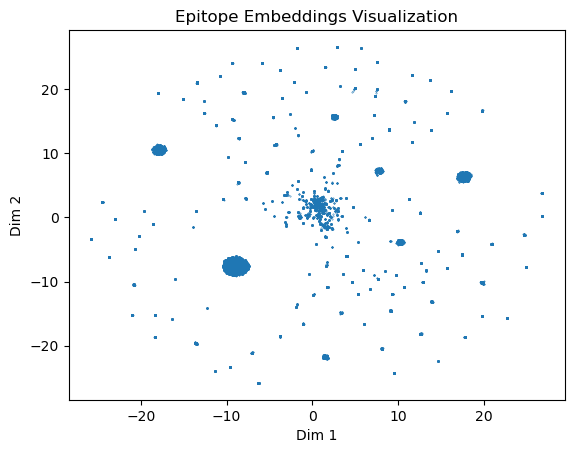

In [36]:
plt.title("Epitope Embeddings Visualization")
plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], s=0.1, cmap='Spectral')

In [37]:
hdb = HDBSCAN(
    min_cluster_size=5, 
    min_samples=5)
hdb.fit(umap_embeddings)

labels = hdb.labels_

/tmp/ipykernel_62280/472355150.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(rect=[0, 0.1, 1, 1])  # The rect argument adjusts the subplot position


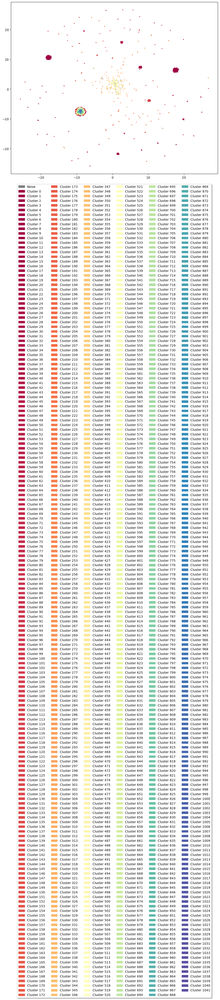

In [38]:
clustered = (labels >= 0)

# Create a list of patches for the legend
clusters = np.unique(labels)
legend_patches = [
    mpatches.Patch(color=plt.cm.Spectral(label / np.max(clusters)), label=f'Cluster {label}')
    for label in clusters if label >= 0
]
legend_patches.insert(0, mpatches.Patch(color='gray', label='Noise'))

# Define the figure size and adjust it as necessary
plt.figure(figsize=(12, 10))

# Plot the scatter points
plt.scatter(umap_embeddings[~clustered, 0], umap_embeddings[~clustered, 1],
            color='gray', s=1, alpha=0.5, label='Noise')
plt.scatter(umap_embeddings[clustered, 0], umap_embeddings[clustered, 1],
            c=labels[clustered], s=1, cmap='Spectral')

# Add a legend with a specified number of columns
num_legend_cols = 6
plt.legend(handles=legend_patches, loc='upper center', bbox_to_anchor=(0.5, -0.05),
           fancybox=True, shadow=True, ncol=num_legend_cols)

# Adjust the layout to make space for the legend
plt.tight_layout(rect=[0, 0.1, 1, 1])  # The rect argument adjusts the subplot position

# Show the plot
plt.show()


In [39]:
# Create a DataFrame that contains your UMAP components and labels
df = pd.DataFrame(umap_embeddings, columns=['UMAP 1', 'UMAP 2'])
df['Label'] = labels
df['Epitope'] = beta_df["Epitope"]  # Replace with your actual epitope data

# Create the figure using Plotly Express
fig = px.scatter(
    df, x='UMAP 1', y='UMAP 2',
    color='Label',  # This will use your labels for coloring
    hover_data=['Epitope'],  # This will show the epitope on hover
    color_continuous_scale=px.colors.sequential.Viridis,  # Optional color scale for aesthetic purposes
    labels={'Label': 'Cluster Label'},  # Rename legends and axes
)

# Customize the layout
fig.update_layout(
    title='Epitope Clustering Visualization',
    coloraxis_colorbar=dict(title='Cluster Label'),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Rockwell"),
)

# Show the plot
fig.show()


In [40]:
# beta_df["HDBSCAN Label"] = labels

In [41]:
# beta_df["HDBSCAN Label"]

In [42]:
max_index = len(beta_df) - 1 
negative_samples_clustering1 = []

In [43]:
def search_negative_epitope_clustering1(df, index, current_epitope):
    df = df
    index = index
    epitope = current_epitope
    label = df["HDBSCAN Label"][index]
    # print(epitope_embedding)
    random_epitope_index = np.random.randint(0, max_index)
    random_epitope = df["Epitope"][random_epitope_index]
    random_epitope_label = df["HDBSCAN Label"][random_epitope_index]

    if random_epitope_label != label and \
        random_epitope != epitope: 
        negative_samples_clustering1.append(random_epitope)
    else: 
        search_negative_epitope(df, index)        

In [44]:
# This takes some minutes, thats why it is commented out! If needed, remove the comments!

for i, epitope in enumerate(beta_df["Epitope"]): 
    search_negative_epitope_clustering1(beta_df, i, epitope)


KeyError: 'HDBSCAN Label'

In [ ]:
# UMAP + HDBSCAN
negative_samples_clustering1

In [ ]:
'''
to_path = "../data/customDatasets/negative_samples/temp"
file_name = "beta_epitope_embeddings.tsv"
beta_df.to_csv(to_path+"/"+file_name, sep="\t", index=False)
'''

In [ ]:
beta_df

## PCA

In [ ]:
# use PCA as well for completeness
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_embeddings = pca.fit_transform(beta_df["Epitope Embedding"].to_list())
len(np.unique(pca_embeddings, axis=0))

In [ ]:
plt.title("PCA - Epitope Embeddings Visualization")
plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
plt.scatter(pca_embeddings[:, 0], pca_embeddings[:, 1], s=0.1, cmap='Spectral');

In [ ]:
np.mean(pca.explained_variance_ratio_)

very low explained variance with n_components = 2!

criterias to be a nagative sample for an epitope: 
1. check if epitope is in same cluster 
2. if not: take this epitope as negative sample 

=> I (CG) do not highly trust the clustering... maybe we can combine it with the levenshtein approach? so: 

    if not in cluster AND levenshtein >= x, where x is a random number in an interval